### 1. SETUP Y CONFIGURACIÓN


##### 1.1 Imports

In [1]:
# Core
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import os
from pathlib import Path

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision import models

# Image processing
from PIL import Image
from skimage import color, io
import cv2

# Metrics
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Utils
import warnings
warnings.filterwarnings('ignore')

# Verificar versiones
print(f"PyTorch version: {torch.__version__}")
print(f"Torchvision version: {torchvision.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

from utils import rgb_to_lab, lab_to_rgb, normalize_lab, denormalize_lab

PyTorch version: 2.9.1+cu128
Torchvision version: 0.24.1+cu128
CUDA available: True


##### 1.2 Configuración de Seeds


In [2]:
def set_seed(seed=42):
    """
    Configura seeds para reproducibilidad.
    """
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # para multi-GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    print(f"Seed configurada: {seed}")

# Aplicar seed
set_seed(42)

Seed configurada: 42


##### 1.3 Hiperparámetros Globales


In [3]:
class Config:
    """
    Configuración global del proyecto.
    """
    # Paths
    DATA_DIR = Path("data/raw")
    SAMPLES_DIR = Path("data/samples")
    
    # Dataset
    IMG_SIZE = 256  # Resolución de trabajo
    BATCH_SIZE = 32  # Ajustar según GPU
    NUM_WORKERS = 4  # Para DataLoader
    
    # Training
    NUM_EPOCHS = 3  # Ajustaremos según resultados
    LEARNING_RATE = 1e-3
    WEIGHT_DECAY = 1e-4
    
    # Model
    BACKBONE = "resnet18"  # Opciones: resnet18, resnet50, vgg16
    PRETRAINED = True
    
    # Early stopping
    PATIENCE = 10
    
    # Reproducibilidad
    SEED = 78

config = Config()

print(" Configuración:")
print(f"  - Tamaño de imagen: {config.IMG_SIZE}x{config.IMG_SIZE}")
print(f"  - Batch size: {config.BATCH_SIZE}")
print(f"  - Learning rate: {config.LEARNING_RATE}")
print(f"  - Backbone: {config.BACKBONE}")
print(f"  - Epochs: {config.NUM_EPOCHS}")

 Configuración:
  - Tamaño de imagen: 256x256
  - Batch size: 32
  - Learning rate: 0.001
  - Backbone: resnet18
  - Epochs: 3


### 2. EXPLORACIÓN Y PREPARACIÓN DEL DATASET



#### 2.1 Verificación del Dataset

In [4]:
dataset_path = Path("data/raw/imagewoof2-320")
assert dataset_path.exists(), "Dataset no encontrado. Descargar primero."

train_path = dataset_path / "train"
val_path = dataset_path / "val"

print("Dataset encontrado")
print(f"Train path: {train_path}")
print(f"Val path: {val_path}")

# Ver las clases de perros
classes = sorted([d.name for d in train_path.iterdir() if d.is_dir()])
print(f"\nClases de perros ({len(classes)}):")
for cls in classes:
    print(f"  - {cls}")

Dataset encontrado
Train path: data/raw/imagewoof2-320/train
Val path: data/raw/imagewoof2-320/val

Clases de perros (10):
  - n02086240
  - n02087394
  - n02088364
  - n02089973
  - n02093754
  - n02096294
  - n02099601
  - n02105641
  - n02111889
  - n02115641


#### 2.2 Exploración del Dataset


In [5]:
import glob

# Contar imágenes
train_images = glob.glob(str(train_path / "*" / "*.JPEG"))
val_images = glob.glob(str(val_path / "*" / "*.JPEG"))

print(f"Total imágenes de entrenamiento: {len(train_images)}")
print(f"Total imágenes de validación: {len(val_images)}")

# Clases disponibles
classes = sorted([d.name for d in train_path.iterdir() if d.is_dir()])
print(f"\nNúmero de clases: {len(classes)}")
print(f"Clases: {classes}")

# Distribución por clase
print("\nDistribución por clase (train):")
for cls in classes:
    n_images = len(list((train_path / cls).glob("*.JPEG")))
    print(f"  {cls}: {n_images} imágenes")

Total imágenes de entrenamiento: 9025
Total imágenes de validación: 3929

Número de clases: 10
Clases: ['n02086240', 'n02087394', 'n02088364', 'n02089973', 'n02093754', 'n02096294', 'n02099601', 'n02105641', 'n02111889', 'n02115641']

Distribución por clase (train):
  n02086240: 941 imágenes
  n02087394: 942 imágenes
  n02088364: 932 imágenes
  n02089973: 580 imágenes
  n02093754: 949 imágenes
  n02096294: 943 imágenes
  n02099601: 949 imágenes
  n02105641: 928 imágenes
  n02111889: 921 imágenes
  n02115641: 940 imágenes


In [6]:
# Mapeo de IDs de ImageNet a nombres legibles
CLASS_NAMES = {
    'n01440764': 'tench (pez)',
    'n02102040': 'English springer (perro)',
    'n02979186': 'cassette player',
    'n03000684': 'chain saw',
    'n03028079': 'church (iglesia)',
    'n03394916': 'French horn',
    'n03417042': 'garbage truck',
    'n03425413': 'gas pump',
    'n03445777': 'golf ball',
    'n03888257': 'parachute'
}

print("Clases del dataset:")
for idx, (code, name) in enumerate(CLASS_NAMES.items()):
    print(f"  {idx}: {name} ({code})")

Clases del dataset:
  0: tench (pez) (n01440764)
  1: English springer (perro) (n02102040)
  2: cassette player (n02979186)
  3: chain saw (n03000684)
  4: church (iglesia) (n03028079)
  5: French horn (n03394916)
  6: garbage truck (n03417042)
  7: gas pump (n03425413)
  8: golf ball (n03445777)
  9: parachute (n03888257)


In [7]:
# %%
# Mapping clase (folder) -> índice numérico y viceversa
class_to_idx = {cls_name: i for i, cls_name in enumerate(sorted(classes))}
idx_to_class = {i: cls_name for cls_name, i in class_to_idx.items()}

print("Mapping clase -> idx:")
for cls_name, idx in class_to_idx.items():
    print(f"  {cls_name} -> {idx}")


Mapping clase -> idx:
  n02086240 -> 0
  n02087394 -> 1
  n02088364 -> 2
  n02089973 -> 3
  n02093754 -> 4
  n02096294 -> 5
  n02099601 -> 6
  n02105641 -> 7
  n02111889 -> 8
  n02115641 -> 9


#### 2.4 Visualización de Ejemplos RGB


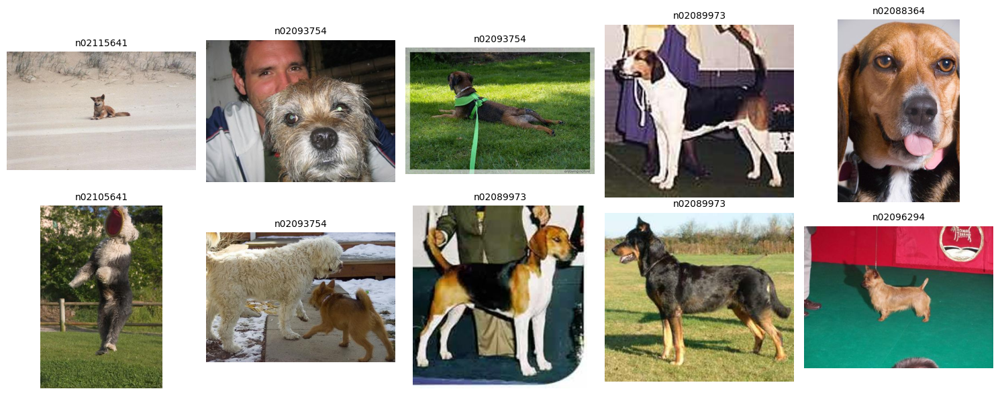

In [8]:
def visualize_random_samples(n_samples=10):
    """
    Visualiza muestras aleatorias del dataset.
    """
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    axes = axes.flatten()
    
    random_images = np.random.choice(train_images, n_samples, replace=False)
    
    for idx, img_path in enumerate(random_images):
        img = Image.open(img_path).convert('RGB')
        
        # Obtener clase
        class_id = Path(img_path).parent.name
        class_name = CLASS_NAMES.get(class_id, class_id)
        
        axes[idx].imshow(img)
        axes[idx].set_title(class_name, fontsize=10)
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

visualize_random_samples(10)

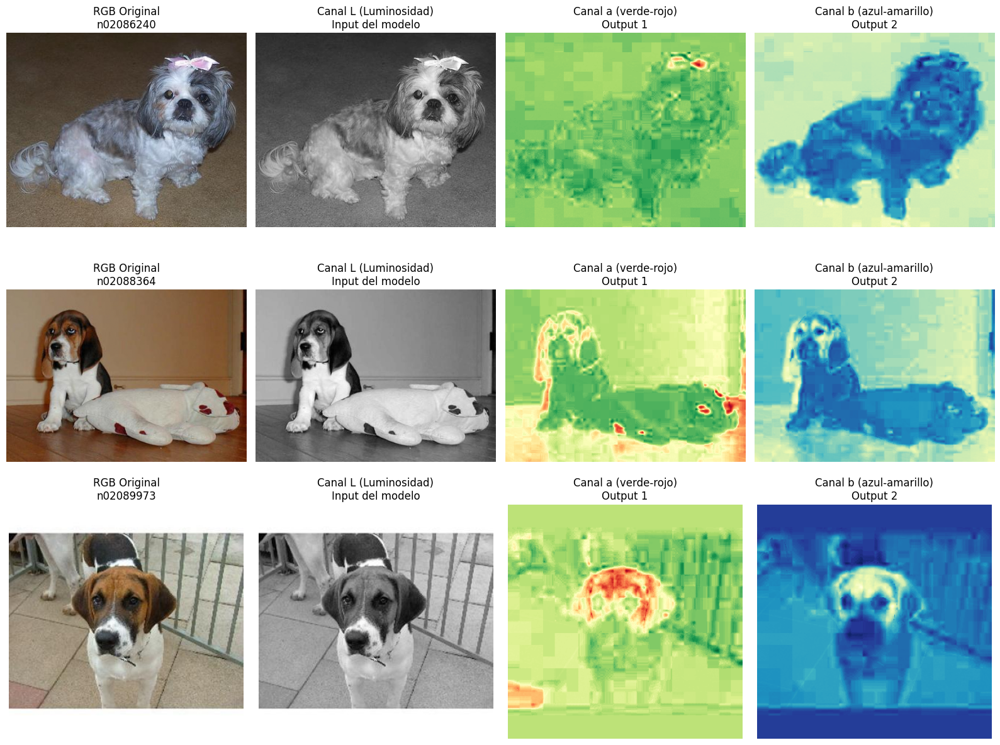

In [9]:
# ============================================
# 2.5 Conversión RGB → Grayscale → LAB
# ============================================

def visualize_color_spaces(n_samples=3):
    """
    Visualiza el proceso de conversión de espacios de color.
    """
    random_images = np.random.choice(train_images, n_samples, replace=False)
    
    fig, axes = plt.subplots(n_samples, 4, figsize=(16, 4*n_samples))
    
    for row, img_path in enumerate(random_images):
        # Cargar imagen RGB
        img_rgb = np.array(Image.open(img_path).convert('RGB')) / 255.0
        
        # Convertir a LAB
        img_lab = color.rgb2lab(img_rgb)
        
        # Extraer canales
        L = img_lab[:, :, 0]  # Luminosidad (grayscale)
        a = img_lab[:, :, 1]  # Canal a
        b = img_lab[:, :, 2]  # Canal b
        
        # Obtener clase
        class_id = Path(img_path).parent.name
        class_name = CLASS_NAMES.get(class_id, class_id)
        
        # Plot
        axes[row, 0].imshow(img_rgb)
        axes[row, 0].set_title(f'RGB Original\n{class_name}')
        axes[row, 0].axis('off')
        
        axes[row, 1].imshow(L, cmap='gray')
        axes[row, 1].set_title('Canal L (Luminosidad)\nInput del modelo')
        axes[row, 1].axis('off')
        
        axes[row, 2].imshow(a, cmap='RdYlGn_r')
        axes[row, 2].set_title('Canal a (verde-rojo)\nOutput 1')
        axes[row, 2].axis('off')
        
        axes[row, 3].imshow(b, cmap='YlGnBu_r')
        axes[row, 3].set_title('Canal b (azul-amarillo)\nOutput 2')
        axes[row, 3].axis('off')
    
    plt.tight_layout()
    plt.show()

visualize_color_spaces(3)

### 3. DATA PIPELINE



In [10]:
# %%
class ColorizationDatasetWithLabels(Dataset):
    """
    Dataset para colorización de imágenes + clasificación de clase.
    
    Input:
        - L (canal de luminancia)  -> (1, H, W)
    Targets:
        - ab (canales de color)    -> (2, H, W)
        - label (índice de clase)  -> int en [0, num_clases-1]
    """
    def __init__(self, image_paths, class_to_idx, transform=None, img_size=256):
        self.image_paths = image_paths
        self.class_to_idx = class_to_idx
        self.transform = transform
        self.img_size = img_size
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        
        # Cargar imagen RGB
        img_rgb = Image.open(img_path).convert('RGB')
        img_rgb = img_rgb.resize((self.img_size, self.img_size), Image.BICUBIC)
        img_rgb = np.array(img_rgb) / 255.0
        
        # Data augmentation (si hay)
        if self.transform:
            img_rgb = self.transform(img_rgb)
        
        # RGB -> LAB
        img_lab = rgb_to_lab(img_rgb)
        L = img_lab[:, :, 0:1]   # (H,W,1)
        ab = img_lab[:, :, 1:]   # (H,W,2)
        
        # Normalización
        L = L / 100.0            # [0,100] -> [0,1]
        ab = ab / 128.0          # [-128,127] -> [-1,1]
        
        # Tensores (C,H,W)
        L  = torch.from_numpy(L.transpose(2, 0, 1)).float()
        ab = torch.from_numpy(ab.transpose(2, 0, 1)).float()
        
        # Label de clase según carpeta
        class_id = Path(img_path).parent.name  # p.ej. 'n03028079'
        label = self.class_to_idx[class_id]
        label = torch.tensor(label, dtype=torch.long)
        
        return L, ab, label


print("ColorizationDatasetWithLabels definido.")


ColorizationDatasetWithLabels definido.


#### 3.2 Data Augmentation


In [11]:
class ImageAugmentation:
    """
    Data augmentation para imágenes RGB.
    Se aplica ANTES de convertir a LAB.
    """
    
    def __init__(self, p=0.5):
        """
        Args:
            p: probabilidad de aplicar cada transformación
        """
        self.p = p
    
    def __call__(self, img):
        """
        Args:
            img: numpy array (H, W, 3) en rango [0, 1]
        
        Returns:
            img_aug: numpy array aumentado
        """
        # Horizontal flip
        if np.random.random() < self.p:
            img = np.fliplr(img)
        
        # Ajustes de brillo (pequeños)
        if np.random.random() < self.p:
            factor = np.random.uniform(0.8, 1.2)
            img = np.clip(img * factor, 0, 1)
        
        # Ajustes de contraste (pequeños)
        if np.random.random() < self.p:
            factor = np.random.uniform(0.8, 1.2)
            mean = img.mean()
            img = np.clip((img - mean) * factor + mean, 0, 1)
        
        return img


# Crear transformación
train_transform = ImageAugmentation(p=0.5)

print("Data augmentation configurado")
print("Transformaciones: horizontal flip, ajuste de brillo, ajuste de contraste")

Data augmentation configurado
Transformaciones: horizontal flip, ajuste de brillo, ajuste de contraste


#### 3.3 DataLoaders

In [12]:
# %%
# Dividir val en val y test (50-50)
val_images_shuffled = val_images.copy()
np.random.shuffle(val_images_shuffled)

n_val = len(val_images_shuffled) // 2
val_images_final = val_images_shuffled[:n_val]
test_images_final = val_images_shuffled[n_val:]

print(f"Split del dataset:")
print(f"  Train: {len(train_images)} imágenes")
print(f"  Val: {len(val_images_final)} imágenes")
print(f"  Test: {len(test_images_final)} imágenes")

# Datasets con labels (mismas splits que antes)
train_dataset_cls = ColorizationDatasetWithLabels(
    train_images,
    class_to_idx=class_to_idx,
    transform=train_transform,
    img_size=config.IMG_SIZE,
)

val_dataset_cls = ColorizationDatasetWithLabels(
    val_images_final,
    class_to_idx=class_to_idx,
    transform=None,
    img_size=config.IMG_SIZE,
)

test_dataset_cls = ColorizationDatasetWithLabels(
    test_images_final,
    class_to_idx=class_to_idx,
    transform=None,
    img_size=config.IMG_SIZE,
)

# DataLoaders con labels
train_loader_cls = DataLoader(
    train_dataset_cls,
    batch_size=config.BATCH_SIZE,
    shuffle=True,
    num_workers=config.NUM_WORKERS,
    pin_memory=True,
)

val_loader_cls = DataLoader(
    val_dataset_cls,
    batch_size=config.BATCH_SIZE,
    shuffle=False,
    num_workers=config.NUM_WORKERS,
    pin_memory=True,
)

test_loader_cls = DataLoader(
    test_dataset_cls,
    batch_size=config.BATCH_SIZE,
    shuffle=False,
    num_workers=config.NUM_WORKERS,
    pin_memory=True,
)

print("DataLoaders con labels creados:")
print(f"  Train batches: {len(train_loader_cls)}")
print(f"  Val batches:   {len(val_loader_cls)}")
print(f"  Test batches:  {len(test_loader_cls)}")

# Sanity check de un batch
L_b, ab_b, labels_b = next(iter(train_loader_cls))
print("\nBatch ejemplo (con labels):")
print(f"  L shape:      {L_b.shape}")       # (B,1,256,256)
print(f"  ab shape:     {ab_b.shape}")      # (B,2,256,256)
print(f"  labels shape: {labels_b.shape}")  # (B,)
print(f"  labels min/max: {labels_b.min().item()} / {labels_b.max().item()}")


Split del dataset:
  Train: 9025 imágenes
  Val: 1964 imágenes
  Test: 1965 imágenes
DataLoaders con labels creados:
  Train batches: 283
  Val batches:   62
  Test batches:  62



Batch ejemplo (con labels):
  L shape:      torch.Size([32, 1, 256, 256])
  ab shape:     torch.Size([32, 2, 256, 256])
  labels shape: torch.Size([32])
  labels min/max: 0 / 9


#### 3.4 Verificación del DataLoader


Batch de entrenamiento:
  L shape: torch.Size([32, 1, 256, 256])
  ab shape: torch.Size([32, 2, 256, 256])
  L range: [0.000, 1.000]
  ab range: [-0.550, 0.569]


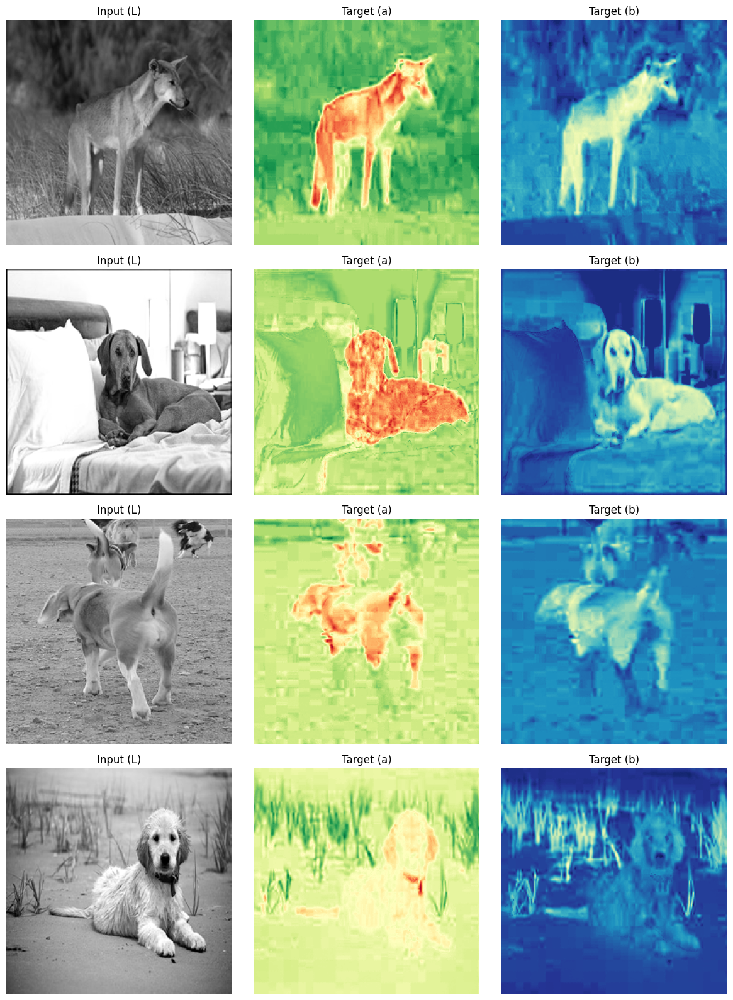

In [13]:
# Obtener un batch de ejemplo
L_batch, ab_batch, labels_batch = next(iter(train_loader_cls))

print("Batch de entrenamiento:")
print(f"  L shape: {L_batch.shape}")  # (batch_size, 1, 256, 256)
print(f"  ab shape: {ab_batch.shape}")  # (batch_size, 2, 256, 256)
print(f"  L range: [{L_batch.min():.3f}, {L_batch.max():.3f}]")
print(f"  ab range: [{ab_batch.min():.3f}, {ab_batch.max():.3f}]")

# Visualizar algunas imágenes del batch
def visualize_batch(L_batch, ab_batch, n_samples=4):
    """
    Visualiza ejemplos de un batch.
    """
    fig, axes = plt.subplots(n_samples, 3, figsize=(12, 4*n_samples))
    
    for i in range(n_samples):
        # Obtener imagen del batch
        L = L_batch[i].cpu().numpy()  # (1, H, W)
        ab = ab_batch[i].cpu().numpy()  # (2, H, W)
        
        # Desnormalizar
        L = L[0] * 100.0  # (H, W)
        ab = ab.transpose(1, 2, 0) * 128.0  # (H, W, 2)
        
        # Reconstruir LAB
        lab = np.zeros((L.shape[0], L.shape[1], 3))
        lab[:, :, 0] = L
        lab[:, :, 1:] = ab
        
        # Convertir a RGB
        rgb = lab_to_rgb(lab)
        
        # Plot
        axes[i, 0].imshow(L, cmap='gray')
        axes[i, 0].set_title('Input (L)')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(ab[:, :, 0], cmap='RdYlGn_r')
        axes[i, 1].set_title('Target (a)')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(ab[:, :, 1], cmap='YlGnBu_r')
        axes[i, 2].set_title('Target (b)')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

visualize_batch(L_batch, ab_batch, n_samples=4)

In [14]:
# Cargar ResNet18 preentrenado en ImageNet
backbone = models.resnet18(pretrained=True)

# Ver la arquitectura
print("Arquitectura de ResNet18:")
print(backbone)
print("\n" + "="*50)

# Congelar todos los parámetros
for param in backbone.parameters():
    param.requires_grad = False

print("Todos los parámetros del backbone congelados")

# Verificar qué parámetros son entrenables
trainable_params = sum(p.numel() for p in backbone.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in backbone.parameters())

print(f"Parámetros entrenables: {trainable_params:,}")
print(f"Parámetros totales: {total_params:,}")

Arquitectura de ResNet18:
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (re

In [15]:
# Mover a device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [16]:
class WeightedMSELoss(nn.Module):
    """
    MSE con peso mayor en valores alejados de 0.
    Penaliza más cuando el modelo predice neutral en zonas coloridas.
    """
    def __init__(self):
        super(WeightedMSELoss, self).__init__()
    
    def forward(self, pred, target):
        # Peso basado en la magnitud del target
        # Si el target es colorido (lejos de 0), peso mayor
        magnitude = torch.sqrt(target[:, 0]**2 + target[:, 1]**2)  # Magnitud en espacio ab
        weight = 1.0 + 2.0 * magnitude  # Peso entre 1 y 3
        
        # MSE ponderado
        mse = (pred - target) ** 2
        weighted_mse = mse * weight.unsqueeze(1)
        
        return weighted_mse.mean()


# Crear nueva loss
criterion_weighted = WeightedMSELoss()

print("Nueva función de pérdida: MSE ponderado por saturación del color")

Nueva función de pérdida: MSE ponderado por saturación del color


In [17]:
# %%
class UNetColorizerGlobal(nn.Module):
    """
    U-Net para colorización + rama global tipo Iizuka.

    Encoder: ResNet18 preentrenado
    Decoder: igual que el U-Net base
    Extra:
      - Rama global desde x4 (B,512,8,8) -> g (B,256) -> logits (B,num_classes)
      - Fusión de g en el decoder (después de dec3, en 16x16)
    """
    def __init__(self, num_classes, backbone=None, freeze_backbone=True, global_dim=256):
        super().__init__()
        
        if backbone is None:
            backbone = models.resnet18(pretrained=True)
        
        # Encoder (ResNet18)
        self.conv1   = backbone.conv1   # (B, 64, 128, 128)
        self.bn1     = backbone.bn1
        self.relu    = backbone.relu
        self.maxpool = backbone.maxpool
        
        self.layer1 = backbone.layer1   # (B, 64, 64, 64)
        self.layer2 = backbone.layer2   # (B, 128, 32, 32)
        self.layer3 = backbone.layer3   # (B, 256, 16, 16)
        self.layer4 = backbone.layer4   # (B, 512, 8, 8)
        
        if freeze_backbone:
            for p in backbone.parameters():
                p.requires_grad = False
        
        # --- Decoder igual al U-Net base ---
        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
            )
        
        self.up3  = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)  # 8 -> 16
        self.dec3 = conv_block(256 + 256, 256)                             # (d3 + x3)
        
        self.up2  = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)  # 16 -> 32
        self.dec2 = conv_block(128 + 128, 128)
        
        self.up1  = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)   # 32 -> 64
        self.dec1 = conv_block(64 + 64, 64)
        
        self.up0  = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)    # 64 -> 128
        self.dec0 = conv_block(32 + 64, 32)                                # skip con x0
        
        self.up_out   = nn.ConvTranspose2d(32, 16, kernel_size=2, stride=2)  # 128 -> 256
        self.out_conv = nn.Conv2d(16, 2, kernel_size=1)                      # canales a,b
        self.tanh     = nn.Tanh()
        
        # --- Rama global desde x4 ---
        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))  # B,512,1,1 -> B,512
        self.global_fc = nn.Sequential(
            nn.Linear(512, global_dim),
            nn.ReLU(inplace=True),
        )
        self.classifier = nn.Linear(global_dim, num_classes)
        self.global_dim = global_dim
        
        # --- Fusión de g en el decoder, después de dec3 (16x16) ---
        # d3: (B,256,16,16)  +  g expandido: (B,global_dim,16,16)
        self.fusion3 = nn.Sequential(
            nn.Conv2d(256 + global_dim, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
        )
    
    def forward(self, x):
        # x: (B,1,256,256) -> replicamos a 3 canales
        x = x.repeat(1, 3, 1, 1)  # (B, 3, 256, 256)
        
        # Encoder
        x0 = self.relu(self.bn1(self.conv1(x)))      # (B, 64, 128, 128)
        x1 = self.layer1(self.maxpool(x0))           # (B, 64, 64, 64)
        x2 = self.layer2(x1)                         # (B, 128, 32, 32)
        x3 = self.layer3(x2)                         # (B, 256, 16, 16)
        x4 = self.layer4(x3)                         # (B, 512, 8, 8)
        
        # Rama global
        g_feat = self.global_pool(x4)                # (B,512,1,1)
        g_vec  = g_feat.view(g_feat.size(0), -1)     # (B,512)
        g      = self.global_fc(g_vec)               # (B,global_dim)
        logits = self.classifier(g)                  # (B,num_classes)
        
        # Decoder con skip connections
        d3 = self.up3(x4)                            # (B,256,16,16)
        d3 = torch.cat([d3, x3], dim=1)              # (B,512,16,16)
        d3 = self.dec3(d3)                           # (B,256,16,16)
        
        # Fusión global-local en 16x16
        B, C, H, W = d3.shape
        g_expand = g.view(B, self.global_dim, 1, 1).expand(-1, -1, H, W)  # (B,global_dim,16,16)
        d3 = torch.cat([d3, g_expand], dim=1)         # (B,256+global_dim,16,16)
        d3 = self.fusion3(d3)                         # (B,256,16,16)
        
        d2 = self.up2(d3)                             # (B,128,32,32)
        d2 = torch.cat([d2, x2], dim=1)               # (B,256,32,32)
        d2 = self.dec2(d2)                            # (B,128,32,32)
        
        d1 = self.up1(d2)                             # (B,64,64,64)
        d1 = torch.cat([d1, x1], dim=1)               # (B,128,64,64)
        d1 = self.dec1(d1)                            # (B,64,64,64)
        
        d0 = self.up0(d1)                             # (B,32,128,128)
        d0 = torch.cat([d0, x0], dim=1)               # (B,96,128,128)
        d0 = self.dec0(d0)                            # (B,32,128,128)
        
        d_out = self.up_out(d0)                       # (B,16,256,256)
        ab = self.out_conv(d_out)                     # (B,2,256,256)
        ab = self.tanh(ab)                            # [-1,1]
        
        # Devolvemos color + logits de clase
        return ab, logits


In [18]:
# %%
criterion_color = criterion_weighted          # tu WeightedMSE
criterion_class = nn.CrossEntropyLoss()
alpha = 0.01                                  # de arranque, algo > 0

# Crear modelo
backbone_unet = models.resnet18(pretrained=True)
model_unet_global = UNetColorizerGlobal(
    num_classes=len(classes),
    backbone=backbone_unet,
    freeze_backbone=True,
    global_dim=256,
).to(device)

# Batch de prueba
L_b, ab_b, labels_b = next(iter(train_loader_cls))
L_b      = L_b.to(device)
ab_b     = ab_b.to(device)
labels_b = labels_b.to(device)

ab_pred_b, logits_b = model_unet_global(L_b)

print("Shapes forward UNetColorizerGlobal:")
print(f"  L:        {L_b.shape}")
print(f"  ab_true:  {ab_b.shape}")
print(f"  ab_pred:  {ab_pred_b.shape}")
print(f"  logits:   {logits_b.shape}")

# Pérdida combinada ejemplo
loss_c = criterion_color(ab_pred_b, ab_b)
loss_cls = criterion_class(logits_b, labels_b)
loss_tot = loss_c + alpha * loss_cls

print("\nLosses ejemplo:")
print(f"  L_color: {loss_c.item():.4f}")
print(f"  L_class: {loss_cls.item():.4f}")
print(f"  L_total: {loss_tot.item():.4f}")


Shapes forward UNetColorizerGlobal:
  L:        torch.Size([32, 1, 256, 256])
  ab_true:  torch.Size([32, 2, 256, 256])
  ab_pred:  torch.Size([32, 2, 256, 256])
  logits:   torch.Size([32, 10])

Losses ejemplo:
  L_color: 0.0578
  L_class: 2.4332
  L_total: 0.0822


In [19]:
# %%
criterion_color = criterion_weighted        # Weighted MSE que definiste antes
criterion_class = nn.CrossEntropyLoss()

def train_epoch_unet_global(model, loader, optimizer, device, alpha=0.01):
    model.train()
    running_total = 0.0
    running_color = 0.0
    running_class = 0.0
    
    pbar = tqdm(loader, desc="Train UNet+Global")
    for L, ab, labels in pbar:
        L      = L.to(device)
        ab     = ab.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        
        ab_pred, logits = model(L)
        
        loss_color = criterion_color(ab_pred, ab)
        loss_class = criterion_class(logits, labels)
        loss_total = loss_color + alpha * loss_class
        
        loss_total.backward()
        optimizer.step()
        
        running_total += loss_total.item()
        running_color += loss_color.item()
        running_class += loss_class.item()
        
        pbar.set_postfix({
            "total": f"{loss_total.item():.4f}",
            "color": f"{loss_color.item():.4f}",
            "class": f"{loss_class.item():.4f}",
        })
    
    n_batches = len(loader)
    return (
        running_total / n_batches,
        running_color / n_batches,
        running_class / n_batches,
    )


def validate_epoch_unet_global(model, loader, device, alpha=0.01):
    model.eval()
    running_total = 0.0
    running_color = 0.0
    running_class = 0.0
    
    with torch.no_grad():
        for L, ab, labels in tqdm(loader, desc="Val UNet+Global"):
            L      = L.to(device)
            ab     = ab.to(device)
            labels = labels.to(device)
            
            ab_pred, logits = model(L)
            
            loss_color = criterion_color(ab_pred, ab)
            loss_class = criterion_class(logits, labels)
            loss_total = loss_color + alpha * loss_class
            
            running_total += loss_total.item()
            running_color += loss_color.item()
            running_class += loss_class.item()
    
    n_batches = len(loader)
    return (
        running_total / n_batches,
        running_color / n_batches,
        running_class / n_batches,
    )

print("Funciones de train/val para UNetColorizerGlobal definidas.")


Funciones de train/val para UNetColorizerGlobal definidas.


In [20]:
# %%
# MEJORA 2: Rama Global Profunda (estilo Iizuka completo)

class UNetColorizerGlobalV3(nn.Module):
    """V3: Rama global MÁS PROFUNDA + fusión residual"""
    def __init__(self, num_classes, backbone=None, freeze_backbone=True, global_dim=256):
        super().__init__()
        
        if backbone is None:
            backbone = models.resnet18(pretrained=True)
        
        # Encoder - IGUAL
        self.conv1 = backbone.conv1
        self.bn1 = backbone.bn1
        self.relu = backbone.relu
        self.maxpool = backbone.maxpool
        self.layer1 = backbone.layer1
        self.layer2 = backbone.layer2
        self.layer3 = backbone.layer3
        self.layer4 = backbone.layer4
        
        if freeze_backbone:
            for p in backbone.parameters():
                p.requires_grad = False
        
        # Decoder - IGUAL
        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
            )
        
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = conv_block(256 + 256, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = conv_block(128 + 128, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = conv_block(64 + 64, 64)
        self.up0 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.dec0 = conv_block(32 + 64, 32)
        self.up_out = nn.ConvTranspose2d(32, 16, kernel_size=2, stride=2)
        self.out_conv = nn.Conv2d(16, 2, kernel_size=1)
        self.tanh = nn.Tanh()
        
        # 🔥 RAMA GLOBAL PROFUNDA (como paper Iizuka)
        self.global_conv = nn.Sequential(
            # 512x8x8 -> 512x4x4
            nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            # 512x4x4 -> 512x4x4
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            # 512x4x4 -> 512x2x2
            nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            # 512x2x2 -> 512x2x2
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
        )
        
        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))
        
        # 🔥 FCs profundas con Dropout
        self.global_fc = nn.Sequential(
            nn.Linear(512, 1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(1024, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, global_dim),
            nn.ReLU(inplace=True),
        )
        
        self.classifier = nn.Linear(global_dim, num_classes)
        self.global_dim = global_dim
        
        # Fusión residual
        self.fusion3_proj = nn.Sequential(
            nn.Conv2d(global_dim, 256, kernel_size=1),
            nn.BatchNorm2d(256),
        )
        self.fusion3_gate = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        x = x.repeat(1, 3, 1, 1)
        
        # Encoder
        x0 = self.relu(self.bn1(self.conv1(x)))
        x1 = self.layer1(self.maxpool(x0))
        x2 = self.layer2(x1)
        x3 = self.layer3(x2)
        x4 = self.layer4(x3)  # (B,512,8,8)
        
        # 🔥 Rama global PROFUNDA
        g_feat = self.global_conv(x4)           # (B,512,2,2)
        g_pooled = self.global_pool(g_feat)     # (B,512,1,1)
        g_vec = g_pooled.view(g_pooled.size(0), -1)  # (B,512)
        g = self.global_fc(g_vec)               # (B,global_dim)
        logits = self.classifier(g)             # (B,num_classes)
        
        # Decoder
        d3 = self.up3(x4)
        d3 = torch.cat([d3, x3], dim=1)
        d3 = self.dec3(d3)
        
        # Fusión residual
        B, C, H, W = d3.shape
        g_expand = g.view(B, self.global_dim, 1, 1).expand(-1, -1, H, W)
        g_spatial = self.fusion3_proj(g_expand)
        gate = self.fusion3_gate(g_spatial)
        d3 = d3 * (1.0 - gate) + g_spatial * gate
        
        d2 = self.up2(d3)
        d2 = torch.cat([d2, x2], dim=1)
        d2 = self.dec2(d2)
        
        d1 = self.up1(d2)
        d1 = torch.cat([d1, x1], dim=1)
        d1 = self.dec1(d1)
        
        d0 = self.up0(d1)
        d0 = torch.cat([d0, x0], dim=1)
        d0 = self.dec0(d0)
        
        d_out = self.up_out(d0)
        ab = self.out_conv(d_out)
        ab = self.tanh(ab)
        
        return ab, logits

print("✅ UNetColorizerGlobalV3 definida (rama global PROFUNDA)")

# Entrenar V3
backbone_v3 = models.resnet18(pretrained=True)
model_v3 = UNetColorizerGlobalV3(
    num_classes=len(classes),
    backbone=backbone_v3,
    freeze_backbone=True,
    global_dim=256,
).to(device)

# Cargar pesos base
try:
    state_dict_base = torch.load("best_unet_model_v2.pth", map_location=device)
    model_v3.load_state_dict(state_dict_base, strict=False)
    print("✅ Pesos base cargados en V3")
except:
    print("⚠️  V3 desde cero")

optimizer_v3 = optim.Adam(
    filter(lambda p: p.requires_grad, model_v3.parameters()),
    lr=1e-3,
    weight_decay=config.WEIGHT_DECAY,
)

scheduler_v3 = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_v3, T_max=15, eta_min=1e-6
)

best_val_v3 = float("inf")

"""print("\n🚀 Entrenando V3 (Rama Global PROFUNDA) - 15 epochs\n")

for epoch in range(2):
    print(f"\n[V3-Deep] Epoch {epoch+1}/15")
    
    train_total, train_color, train_class = train_epoch_unet_global(
        model_v3, train_loader_cls, optimizer_v3, device, alpha=0.01
    )
    val_total, val_color, val_class = validate_epoch_unet_global(
        model_v3, val_loader_cls, device, alpha=0.01
    )
    
    scheduler_v3.step()
    lr = optimizer_v3.param_groups[0]["lr"]
    
    print(f"  Train: tot={train_total:.4f} col={train_color:.4f} cls={train_class:.4f}")
    print(f"  Val:   tot={val_total:.4f} col={val_color:.4f} cls={val_class:.4f}")
    print(f"  LR: {lr:.6f}")
    
    if val_total < best_val_v3:
        best_val_v3 = val_total
        torch.save(model_v3.state_dict(), "best_model_v3_deep.pth")
        print("  >> 💾 Mejor modelo V3 guardado!")

print(f"\n✅ V3 completo. Mejor: {best_val_v3:.6f}")"""

✅ UNetColorizerGlobalV3 definida (rama global PROFUNDA)


✅ Pesos base cargados en V3


'print("\n🚀 Entrenando V3 (Rama Global PROFUNDA) - 15 epochs\n")\n\nfor epoch in range(2):\n    print(f"\n[V3-Deep] Epoch {epoch+1}/15")\n    \n    train_total, train_color, train_class = train_epoch_unet_global(\n        model_v3, train_loader_cls, optimizer_v3, device, alpha=0.01\n    )\n    val_total, val_color, val_class = validate_epoch_unet_global(\n        model_v3, val_loader_cls, device, alpha=0.01\n    )\n    \n    scheduler_v3.step()\n    lr = optimizer_v3.param_groups[0]["lr"]\n    \n    print(f"  Train: tot={train_total:.4f} col={train_color:.4f} cls={train_class:.4f}")\n    print(f"  Val:   tot={val_total:.4f} col={val_color:.4f} cls={val_class:.4f}")\n    print(f"  LR: {lr:.6f}")\n    \n    if val_total < best_val_v3:\n        best_val_v3 = val_total\n        torch.save(model_v3.state_dict(), "best_model_v3_deep.pth")\n        print("  >> 💾 Mejor modelo V3 guardado!")\n\nprint(f"\n✅ V3 completo. Mejor: {best_val_v3:.6f}")'

✅ Generados 400 bins de color válidos (de 400 candidatos)
Número de clases de color: Q = 400
Primeros 10 bins:
[[-110.        -110.       ]
 [-110.         -98.42105  ]
 [-110.         -86.8421   ]
 [-110.         -75.26316  ]
 [-110.         -63.68421  ]
 [-110.         -52.105263 ]
 [-110.         -40.526318 ]
 [-110.         -28.947369 ]
 [-110.         -17.368422 ]
 [-110.          -5.7894735]]


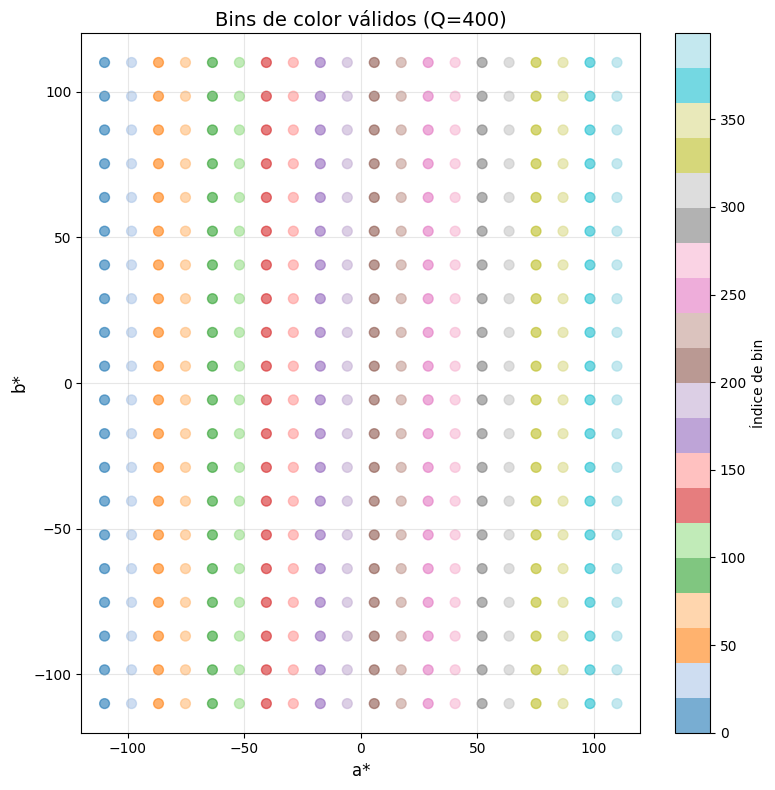

✅ Bins guardados en pts_ab_torch: torch.Size([400, 2])


In [21]:
# %%
# PASO 1: Generar bins de colores en espacio LAB

import numpy as np
from sklearn.cluster import KMeans
from skimage import color
import matplotlib.pyplot as plt

def generate_ab_bins(grid_size=20, L_value=50):
    """
    Genera una grilla uniforme de bins en espacio ab
    y filtra los que son válidos (dentro del gamut RGB).
    
    Args:
        grid_size: número de divisiones por eje (a y b)
        L_value: valor de luminancia para verificar gamut
    
    Returns:
        pts_ab: array (Q, 2) con centros de bins válidos
    """
    # Grilla uniforme en [-110, 110] para a y b
    a_range = np.linspace(-110, 110, grid_size)
    b_range = np.linspace(-110, 110, grid_size)
    
    pts_ab_list = []
    
    for a in a_range:
        for b in b_range:
            # Crear punto LAB
            lab_point = np.array([[[L_value, a, b]]], dtype=np.float32)
            
            # Intentar convertir a RGB
            try:
                rgb_point = color.lab2rgb(lab_point)
                
                # Verificar si está en gamut (todos los valores en [0,1])
                if np.all(rgb_point >= 0) and np.all(rgb_point <= 1):
                    pts_ab_list.append([a, b])
            except:
                pass
    
    pts_ab = np.array(pts_ab_list, dtype=np.float32)
    
    print(f"✅ Generados {len(pts_ab)} bins de color válidos (de {grid_size**2} candidatos)")
    
    return pts_ab

# Generar bins
pts_ab_np = generate_ab_bins(grid_size=20, L_value=50)
pts_ab_torch = torch.from_numpy(pts_ab_np)
Q = pts_ab_torch.shape[0]

print(f"Número de clases de color: Q = {Q}")
print(f"Primeros 10 bins:\n{pts_ab_np[:10]}")

# Visualizar distribución de bins
plt.figure(figsize=(8, 8))
plt.scatter(pts_ab_np[:, 0], pts_ab_np[:, 1], c=range(len(pts_ab_np)), 
            cmap='tab20', s=50, alpha=0.6)
plt.xlabel('a*', fontsize=12)
plt.ylabel('b*', fontsize=12)
plt.title(f'Bins de color válidos (Q={Q})', fontsize=14)
plt.grid(True, alpha=0.3)
plt.xlim(-120, 120)
plt.ylim(-120, 120)
plt.colorbar(label='Índice de bin')
plt.tight_layout()
plt.savefig('color_bins_distribution.png', dpi=150)
plt.show()

print(f"✅ Bins guardados en pts_ab_torch: {pts_ab_torch.shape}")

In [22]:
# %%
# PASO 2 OPTIMIZADO: Cuantización por chunks (memory-efficient)

class ColorizationDatasetQuantizedFast(Dataset):
    """
    Dataset optimizado: devuelve ab continuo, la cuantización se hace en batch en GPU
    """
    def __init__(self, image_paths, class_labels, img_size=256, transform=None):
        self.image_paths = image_paths
        self.class_labels = class_labels
        self.img_size = img_size
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        class_label = self.class_labels[idx]
        
        img_rgb = Image.open(img_path).convert('RGB')
        img_rgb = img_rgb.resize((self.img_size, self.img_size), Image.BILINEAR)
        
        if self.transform:
            img_rgb = self.transform(img_rgb)
        
        img_rgb_np = np.array(img_rgb).astype(np.float32) / 255.0
        img_lab = color.rgb2lab(img_rgb_np)
        
        L = img_lab[:, :, 0] / 100.0
        a = img_lab[:, :, 1]
        b = img_lab[:, :, 2]
        
        L_tensor = torch.from_numpy(L).unsqueeze(0).float()
        ab_tensor = torch.from_numpy(np.stack([a, b], axis=0)).float()
        class_tensor = torch.tensor(class_label, dtype=torch.long)
        
        return L_tensor, ab_tensor, class_tensor


def quantize_ab_batch_chunked(ab_batch, pts_ab, chunk_size=8192):
    """
    Cuantiza un batch de ab en GPU usando chunks para evitar OOM.
    
    Args:
        ab_batch: (B, 2, H, W) tensor en GPU
        pts_ab: (Q, 2) tensor en GPU con centros de bins
        chunk_size: número de pixels a procesar por vez
    
    Returns:
        q_indices: (B, H, W) tensor con índices de bins
    """
    B, _, H, W = ab_batch.shape
    Q = pts_ab.shape[0]
    
    # Reshape: (B, 2, H, W) -> (B*H*W, 2)
    ab_flat = ab_batch.permute(0, 2, 3, 1).reshape(-1, 2)
    N = ab_flat.shape[0]
    
    # Procesar por chunks
    q_indices_list = []
    
    for start_idx in range(0, N, chunk_size):
        end_idx = min(start_idx + chunk_size, N)
        ab_chunk = ab_flat[start_idx:end_idx]  # (chunk_size, 2)
        
        # Distancias solo para este chunk
        # ab_chunk: (chunk, 2), pts_ab: (Q, 2)
        # Distancia euclidiana: sqrt(sum((a-b)^2))
        dists = torch.cdist(ab_chunk.unsqueeze(1), pts_ab.unsqueeze(0)).squeeze(1)  # (chunk, Q)
        
        # Bin más cercano
        q_chunk = torch.argmin(dists, dim=1)  # (chunk,)
        q_indices_list.append(q_chunk)
    
    # Concatenar todos los chunks
    q_indices = torch.cat(q_indices_list, dim=0)  # (B*H*W,)
    q_indices = q_indices.reshape(B, H, W)
    
    return q_indices


print("✅ ColorizationDatasetQuantizedFast definido")
print("✅ quantize_ab_batch_chunked definido (memory-efficient)")

✅ ColorizationDatasetQuantizedFast definido
✅ quantize_ab_batch_chunked definido (memory-efficient)


In [23]:
# %%
# Crear datasets RÁPIDOS

print(f"📊 Datos disponibles:")
print(f"   Train: {len(train_images)} imágenes")
print(f"   Val: {len(val_images_final)} imágenes")

# Extraer labels
train_labels_list = []
for img_path in train_images:
    class_name = os.path.basename(os.path.dirname(img_path))
    class_idx = class_to_idx[class_name]
    train_labels_list.append(class_idx)

val_labels_list = []
for img_path in val_images_final:
    class_name = os.path.basename(os.path.dirname(img_path))
    class_idx = class_to_idx[class_name]
    val_labels_list.append(class_idx)

print(f"✅ Labels extraídos: train={len(train_labels_list)}, val={len(val_labels_list)}")

# Datasets
train_dataset_quant = ColorizationDatasetQuantizedFast(
    train_images, 
    train_labels_list, 
    img_size=config.IMG_SIZE, 
    transform=None
)

val_dataset_quant = ColorizationDatasetQuantizedFast(
    val_images_final,
    val_labels_list, 
    img_size=config.IMG_SIZE, 
    transform=None
)

print(f"\n✅ Datasets creados:")
print(f"   Train: {len(train_dataset_quant)} imágenes")
print(f"   Val: {len(val_dataset_quant)} imágenes")

# DataLoaders con BATCH SIZE MÁS CHICO para cálculo de pesos
train_loader_quant_small = DataLoader(
    train_dataset_quant, 
    batch_size=8,  # 🔥 Más chico para evitar OOM
    shuffle=True, 
    num_workers=config.NUM_WORKERS, 
    pin_memory=True
)

val_loader_quant = DataLoader(
    val_dataset_quant, 
    batch_size=16, 
    shuffle=False, 
    num_workers=config.NUM_WORKERS, 
    pin_memory=True
)

print(f"\n✅ DataLoaders creados:")
print(f"   Train batches (small): {len(train_loader_quant_small)}")
print(f"   Val batches: {len(val_loader_quant)}")

# Test
L_test, ab_test, label_test = next(iter(train_loader_quant_small))
print(f"\n🧪 Batch de prueba:")
print(f"   L: {L_test.shape}")
print(f"   ab: {ab_test.shape}")
print(f"   labels: {label_test.shape}")

L_test = L_test.to(device)
ab_test = ab_test.to(device)
pts_ab_gpu = pts_ab_torch.to(device)

# Test cuantización con chunks
import time
t0 = time.time()
q_test = quantize_ab_batch_chunked(ab_test, pts_ab_gpu, chunk_size=8192)
t1 = time.time()

print(f"\n✅ Cuantización chunked OK:")
print(f"   q_indices: {q_test.shape}")
print(f"   Tiempo: {(t1-t0)*1000:.2f} ms")
print(f"   Bins únicos: {q_test.unique().numel()} de {Q}")

📊 Datos disponibles:
   Train: 9025 imágenes
   Val: 1964 imágenes
✅ Labels extraídos: train=9025, val=1964

✅ Datasets creados:
   Train: 9025 imágenes
   Val: 1964 imágenes

✅ DataLoaders creados:
   Train batches (small): 1129
   Val batches: 123

🧪 Batch de prueba:
   L: torch.Size([8, 1, 256, 256])
   ab: torch.Size([8, 2, 256, 256])
   labels: torch.Size([8])

✅ Cuantización chunked OK:
   q_indices: torch.Size([8, 256, 256])
   Tiempo: 99.63 ms
   Bins únicos: 70 de 400


In [24]:
# %%
# Calcular pesos (memory-efficient)

def compute_color_class_weights_safe(train_loader, pts_ab, num_classes, device, 
                                     lambda_smooth=0.5, max_batches=100):
    """
    Calcula frecuencias con cuantización chunked (safe para GPU L4).
    """
    print(f"🔍 Calculando frecuencias de {num_classes} clases...")
    
    pts_ab_gpu = pts_ab.to(device)
    counts = torch.zeros(num_classes, dtype=torch.long, device=device)
    total_pixels = 0
    
    for batch_idx, (L, ab, _) in enumerate(tqdm(train_loader, desc="Contando bins")):
        if batch_idx >= max_batches:
            break
        
        ab = ab.to(device)
        
        # Cuantizar con chunks (memory-safe)
        q_indices = quantize_ab_batch_chunked(ab, pts_ab_gpu, chunk_size=8192)
        q_flat = q_indices.view(-1)
        
        # Contar
        batch_counts = torch.bincount(q_flat, minlength=num_classes)
        counts += batch_counts
        total_pixels += q_flat.numel()
    
    # Probabilidades
    p_q = counts.float() / total_pixels
    p_q = torch.clamp(p_q, min=1e-8)
    
    # Pesos
    class_weights = 1.0 / ((1.0 - lambda_smooth) * p_q + lambda_smooth)
    class_weights = class_weights / class_weights.mean()
    
    print(f"✅ Frecuencias calculadas:")
    print(f"   Min freq: {p_q.min():.6f}, Max freq: {p_q.max():.6f}")
    print(f"   Min weight: {class_weights.min():.2f}, Max weight: {class_weights.max():.2f}")
    print(f"   Bins usados: {(counts > 0).sum().item()} de {num_classes}")
    
    return p_q, class_weights

# Calcular pesos
p_q, class_weights = compute_color_class_weights_safe(
    train_loader_quant_small,  # 🔥 Usar loader con batch pequeño
    pts_ab_torch,
    num_classes=Q, 
    device=device,
    lambda_smooth=0.5, 
    max_batches=100  # más batches pero más chicos
)

print(f"\n✅ Class weights calculados para {Q} bins")

🔍 Calculando frecuencias de 400 clases...


Contando bins:   9%|▉         | 100/1129 [00:14<02:24,  7.13it/s]

✅ Frecuencias calculadas:
   Min freq: 0.000000, Max freq: 0.204233
   Min weight: 0.83, Max weight: 1.00
   Bins usados: 154 de 400

✅ Class weights calculados para 400 bins


In [25]:
# %%
# PASO 4: UNetColorizerGlobalV4 - Predice Q clases + clasificación de escena

class UNetColorizerGlobalV4(nn.Module):
    """
    V4: Predice bins cuantizados de color (Q clases) + clasificación global
    
    Cambios vs V3:
    - Output: Q canales (logits para cada bin) en lugar de 2 canales ab
    - Loss: CrossEntropyLoss con class weights en lugar de MSE
    - Decodificación: annealed-mean post-procesamiento
    """
    def __init__(self, num_color_classes, num_scene_classes, backbone=None, 
                 freeze_backbone=True, global_dim=256):
        super().__init__()
        
        if backbone is None:
            backbone = models.resnet18(pretrained=True)
        
        # Encoder ResNet18
        self.conv1 = backbone.conv1
        self.bn1 = backbone.bn1
        self.relu = backbone.relu
        self.maxpool = backbone.maxpool
        self.layer1 = backbone.layer1  # 64 ch
        self.layer2 = backbone.layer2  # 128 ch
        self.layer3 = backbone.layer3  # 256 ch
        self.layer4 = backbone.layer4  # 512 ch
        
        if freeze_backbone:
            for p in backbone.parameters():
                p.requires_grad = False
        
        # Decoder U-Net
        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
            )
        
        # Decoder path
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)  # 8->16
        self.dec3 = conv_block(256 + 256, 256)
        
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)  # 16->32
        self.dec2 = conv_block(128 + 128, 128)
        
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)   # 32->64
        self.dec1 = conv_block(64 + 64, 64)
        
        self.up0 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)    # 64->128
        self.dec0 = conv_block(32 + 64, 32)
        
        self.up_out = nn.ConvTranspose2d(32, 16, kernel_size=2, stride=2) # 128->256
        
        # 🔥 OUTPUT CUANTIZADO: Q clases en lugar de 2 canales
        self.out_conv = nn.Conv2d(16, num_color_classes, kernel_size=1)
        # NO usar Tanh aquí, son logits para CrossEntropy
        
        # 🔥 Rama global PROFUNDA (como paper Iizuka)
        self.global_conv = nn.Sequential(
            # 512x8x8 -> 512x4x4
            nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            # 512x4x4 -> 512x4x4
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            # 512x4x4 -> 512x2x2
            nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            # 512x2x2 -> 512x2x2
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
        )
        
        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))
        
        # FCs profundas con Dropout
        self.global_fc = nn.Sequential(
            nn.Linear(512, 1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(1024, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, global_dim),
            nn.ReLU(inplace=True),
        )
        
        # Clasificador de escena
        self.classifier = nn.Linear(global_dim, num_scene_classes)
        
        self.global_dim = global_dim
        self.num_color_classes = num_color_classes
        self.num_scene_classes = num_scene_classes
        
        # Fusión residual con gate
        self.fusion3_proj = nn.Sequential(
            nn.Conv2d(global_dim, 256, kernel_size=1),
            nn.BatchNorm2d(256),
        )
        self.fusion3_gate = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        # Input: (B, 1, 256, 256)
        # Replicar a 3 canales para ResNet
        x = x.repeat(1, 3, 1, 1)  # (B, 3, 256, 256)
        
        # Encoder
        x0 = self.relu(self.bn1(self.conv1(x)))  # (B, 64, 128, 128)
        x1 = self.layer1(self.maxpool(x0))       # (B, 64, 64, 64)
        x2 = self.layer2(x1)                     # (B, 128, 32, 32)
        x3 = self.layer3(x2)                     # (B, 256, 16, 16)
        x4 = self.layer4(x3)                     # (B, 512, 8, 8)
        
        # 🔥 Rama global profunda
        g_feat = self.global_conv(x4)                    # (B, 512, 2, 2)
        g_pooled = self.global_pool(g_feat)              # (B, 512, 1, 1)
        g_vec = g_pooled.view(g_pooled.size(0), -1)     # (B, 512)
        g = self.global_fc(g_vec)                        # (B, global_dim)
        scene_logits = self.classifier(g)                # (B, num_scene_classes)
        
        # Decoder con skip connections
        d3 = self.up3(x4)                        # (B, 256, 16, 16)
        d3 = torch.cat([d3, x3], dim=1)          # (B, 512, 16, 16)
        d3 = self.dec3(d3)                       # (B, 256, 16, 16)
        
        # 🔥 Fusión global-local en 16x16 con gate
        B, C, H, W = d3.shape
        g_expand = g.view(B, self.global_dim, 1, 1).expand(-1, -1, H, W)
        g_spatial = self.fusion3_proj(g_expand)  # (B, 256, 16, 16)
        gate = self.fusion3_gate(g_spatial)      # (B, 256, 16, 16), [0,1]
        d3 = d3 * (1.0 - gate) + g_spatial * gate
        
        # Resto del decoder
        d2 = self.up2(d3)                        # (B, 128, 32, 32)
        d2 = torch.cat([d2, x2], dim=1)          # (B, 256, 32, 32)
        d2 = self.dec2(d2)                       # (B, 128, 32, 32)
        
        d1 = self.up1(d2)                        # (B, 64, 64, 64)
        d1 = torch.cat([d1, x1], dim=1)          # (B, 128, 64, 64)
        d1 = self.dec1(d1)                       # (B, 64, 64, 64)
        
        d0 = self.up0(d1)                        # (B, 32, 128, 128)
        d0 = torch.cat([d0, x0], dim=1)          # (B, 96, 128, 128)
        d0 = self.dec0(d0)                       # (B, 32, 128, 128)
        
        d_out = self.up_out(d0)                  # (B, 16, 256, 256)
        
        # 🔥 Output: Q logits (sin activación, para CrossEntropyLoss)
        color_logits = self.out_conv(d_out)     # (B, Q, 256, 256)
        
        return color_logits, scene_logits

print("✅ UNetColorizerGlobalV4 definido (quantized colors)")

# Test forward pass
try:
    backbone_test = models.resnet18(pretrained=True)
    model_test = UNetColorizerGlobalV4(
        num_color_classes=Q,
        num_scene_classes=len(classes),
        backbone=backbone_test,
        freeze_backbone=True,
        global_dim=256,
    ).to(device)
    
    L_test, ab_test, labels_test = next(iter(train_loader_quant_small))
    L_test = L_test.to(device)
    
    with torch.no_grad():
        color_logits, scene_logits = model_test(L_test)
    
    print(f"\n✅ Forward pass exitoso:")
    print(f"   Input L: {L_test.shape}")
    print(f"   Output color_logits: {color_logits.shape} (B, Q={Q}, H, W)")
    print(f"   Output scene_logits: {scene_logits.shape} (B, {len(classes)})")
    
    del model_test
    torch.cuda.empty_cache()
    
except Exception as e:
    print(f"❌ Error en test: {e}")

✅ UNetColorizerGlobalV4 definido (quantized colors)



✅ Forward pass exitoso:
   Input L: torch.Size([8, 1, 256, 256])
   Output color_logits: torch.Size([8, 400, 256, 256]) (B, Q=400, H, W)
   Output scene_logits: torch.Size([8, 10]) (B, 10)


In [26]:
# %%
# PASO 5: Decodificar logits a ab continuo (annealed-mean con temperatura)

def decode_ab_annealed(logits, pts_ab, T=0.38):
    """
    Decodifica logits de clases de color a canales a,b continuos
    usando annealed-mean con temperatura T.
    
    Paper Larsson: T=0.38 da buenos resultados (más bajo = más vibrante)
    
    Args:
        logits: (B, Q, H, W) logits sin softmax
        pts_ab: (Q, 2) centros de bins en LAB
        T: temperatura (default 0.38)
    
    Returns:
        ab_pred: (B, 2, H, W) canales a,b continuos
    """
    # Softmax para obtener probabilidades
    probs = F.softmax(logits, dim=1)  # (B, Q, H, W)
    
    # Aplicar temperatura (annealing)
    if T != 1.0:
        probs = probs ** (1.0 / T)
        probs = probs / probs.sum(dim=1, keepdim=True).clamp_min(1e-8)
    
    # Mover pts_ab a mismo device
    pts_ab = pts_ab.to(logits.device).float()
    
    # Weighted average: ab = sum_q( prob_q * center_q )
    # probs: (B,Q,H,W), pts_ab: (Q,2)
    # einsum: 'bqhw,qc->bchw' suma sobre q
    ab_pred = torch.einsum('bqhw,qc->bchw', probs, pts_ab)
    
    return ab_pred

print("✅ decode_ab_annealed definido")

# Test rápido
with torch.no_grad():
    # Crear logits fake
    logits_fake = torch.randn(2, Q, 64, 64).to(device)
    pts_ab_gpu = pts_ab_torch.to(device)
    
    ab_decoded = decode_ab_annealed(logits_fake, pts_ab_gpu, T=0.38)
    print(f"✅ Test decodificación:")
    print(f"   Input logits: {logits_fake.shape}")
    print(f"   Output ab: {ab_decoded.shape}")
    print(f"   Rango ab: [{ab_decoded.min():.2f}, {ab_decoded.max():.2f}]")

✅ decode_ab_annealed definido
✅ Test decodificación:
   Input logits: torch.Size([2, 400, 64, 64])
   Output ab: torch.Size([2, 2, 64, 64])
   Rango ab: [-105.65, 108.40]


In [27]:
# %%
# PASO 6: Training y validation loops para V4

def train_epoch_v4(model, loader, criterion_color, criterion_scene, 
                   optimizer, device, pts_ab, alpha=0.01):
    """
    Entrena V4 por una época.
    
    Args:
        criterion_color: CrossEntropyLoss con class_weights
        criterion_scene: CrossEntropyLoss para clasificación de escena
        pts_ab: (Q, 2) centros de bins para cuantización
    """
    model.train()
    running_total = 0.0
    running_color = 0.0
    running_scene = 0.0
    
    pts_ab_gpu = pts_ab.to(device)
    
    pbar = tqdm(loader, desc="Train V4")
    for L, ab, scene_labels in pbar:
        L = L.to(device)
        ab = ab.to(device)
        scene_labels = scene_labels.to(device)
        
        optimizer.zero_grad()
        
        # Forward
        color_logits, scene_logits = model(L)  # (B,Q,H,W), (B,num_classes)
        
        # Cuantizar ab ground truth en GPU (chunked para evitar OOM)
        with torch.no_grad():
            q_target = quantize_ab_batch_chunked(ab, pts_ab_gpu, chunk_size=8192)
        
        # Loss de color: CrossEntropy pixel-wise
        loss_color = criterion_color(color_logits, q_target)
        
        # Loss de escena: CrossEntropy
        loss_scene = criterion_scene(scene_logits, scene_labels)
        
        # Loss total
        loss_total = loss_color + alpha * loss_scene
        
        loss_total.backward()
        optimizer.step()
        
        running_total += loss_total.item()
        running_color += loss_color.item()
        running_scene += loss_scene.item()
        
        pbar.set_postfix({
            "tot": f"{loss_total.item():.4f}",
            "col": f"{loss_color.item():.4f}",
            "scn": f"{loss_scene.item():.4f}",
        })
    
    n = len(loader)
    return running_total/n, running_color/n, running_scene/n


def validate_epoch_v4(model, loader, criterion_color, criterion_scene, 
                      device, pts_ab, alpha=0.01):
    """Valida V4 sin actualizar pesos."""
    model.eval()
    running_total = 0.0
    running_color = 0.0
    running_scene = 0.0
    
    pts_ab_gpu = pts_ab.to(device)
    
    with torch.no_grad():
        pbar = tqdm(loader, desc="Val V4")
        for L, ab, scene_labels in pbar:
            L = L.to(device)
            ab = ab.to(device)
            scene_labels = scene_labels.to(device)
            
            # Forward
            color_logits, scene_logits = model(L)
            
            # Cuantizar target
            q_target = quantize_ab_batch_chunked(ab, pts_ab_gpu, chunk_size=8192)
            
            # Losses
            loss_color = criterion_color(color_logits, q_target)
            loss_scene = criterion_scene(scene_logits, scene_labels)
            loss_total = loss_color + alpha * loss_scene
            
            running_total += loss_total.item()
            running_color += loss_color.item()
            running_scene += loss_scene.item()
            
            pbar.set_postfix({
                "tot": f"{loss_total.item():.4f}",
                "col": f"{loss_color.item():.4f}",
            })
    
    n = len(loader)
    return running_total/n, running_color/n, running_scene/n

print("✅ train_epoch_v4 y validate_epoch_v4 definidos")

✅ train_epoch_v4 y validate_epoch_v4 definidos


In [28]:
# %%
# PASO 7: Entrenar V4 (cuantizado)

NUM_EPOCHS_V4 = 15
alpha_v4 = 0.01

# Crear modelo V4
backbone_v4 = models.resnet18(pretrained=True)
model_v4 = UNetColorizerGlobalV4(
    num_color_classes=Q,
    num_scene_classes=len(classes),
    backbone=backbone_v4,
    freeze_backbone=True,
    global_dim=256,
).to(device)

# Intentar cargar pesos del decoder de V3
try:
    state_v3 = torch.load("best_model_v3_deep.pth", map_location=device)
    # Cargar solo pesos compatibles (encoder + decoder + global, menos out_conv)
    missing, unexpected = model_v4.load_state_dict(state_v3, strict=False)
    print(f"✅ Pesos V3 cargados en V4")
    print(f"   Missing: {len(missing)} (out_conv esperado)")
    print(f"   Unexpected: {len(unexpected)}")
except:
    print("⚠️  V4 desde cero")

# Loss functions
criterion_color = nn.CrossEntropyLoss(weight=class_weights.to(device))
criterion_scene = nn.CrossEntropyLoss()

# Optimizer
optimizer_v4 = optim.Adam(
    filter(lambda p: p.requires_grad, model_v4.parameters()),
    lr=1e-3,
    weight_decay=config.WEIGHT_DECAY,
)

# Scheduler
scheduler_v4 = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_v4, mode="min", factor=0.5, patience=3
)

# Crear DataLoader normal para entrenamiento (batch size original)
train_loader_quant_train = DataLoader(
    train_dataset_quant, 
    batch_size=config.BATCH_SIZE,  # 32 
    shuffle=True, 
    num_workers=config.NUM_WORKERS, 
    pin_memory=True
)

best_val_v4 = float("inf")

print(f"\n🚀 Entrenando V4 (Quantized + Global) - {NUM_EPOCHS_V4} epochs\n")

for epoch in range(NUM_EPOCHS_V4):
    print(f"\n[V4-Quant] Epoch {epoch+1}/{NUM_EPOCHS_V4}")
    
    train_total, train_color, train_scene = train_epoch_v4(
        model_v4, train_loader_quant_train, criterion_color, criterion_scene,
        optimizer_v4, device, pts_ab_torch, alpha=alpha_v4
    )
    
    val_total, val_color, val_scene = validate_epoch_v4(
        model_v4, val_loader_quant, criterion_color, criterion_scene,
        device, pts_ab_torch, alpha=alpha_v4
    )
    
    scheduler_v4.step(val_total)
    lr = optimizer_v4.param_groups[0]["lr"]
    
    print(f"  Train: tot={train_total:.4f} col={train_color:.4f} scn={train_scene:.4f}")
    print(f"  Val:   tot={val_total:.4f} col={val_color:.4f} scn={val_scene:.4f}")
    print(f"  LR: {lr:.6f}")
    
    if val_total < best_val_v4:
        best_val_v4 = val_total
        torch.save(model_v4.state_dict(), "best_model_v4_quantized.pth")
        print("  >> 💾 Mejor modelo V4 guardado!")

print(f"\n✅ V4 completo. Mejor val: {best_val_v4:.6f}")

⚠️  V4 desde cero

🚀 Entrenando V4 (Quantized + Global) - 15 epochs


[V4-Quant] Epoch 1/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.86it/s, tot=2.9626, col=2.9510]


  Train: tot=3.7231 col=3.7091 scn=1.4056
  Val:   tot=2.7842 col=2.7692 scn=1.5002
  LR: 0.001000
  >> 💾 Mejor modelo V4 guardado!

[V4-Quant] Epoch 2/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.9167, col=2.8976]


  Train: tot=2.7444 col=2.7307 scn=1.3644
  Val:   tot=2.7202 col=2.7038 scn=1.6366
  LR: 0.001000
  >> 💾 Mejor modelo V4 guardado!

[V4-Quant] Epoch 3/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.8842, col=2.8758]


  Train: tot=2.6974 col=2.6842 scn=1.3180
  Val:   tot=2.6664 col=2.6530 scn=1.3362
  LR: 0.001000
  >> 💾 Mejor modelo V4 guardado!

[V4-Quant] Epoch 4/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.7282, col=2.7165]


  Train: tot=2.6255 col=2.6129 scn=1.2620
  Val:   tot=2.5724 col=2.5603 scn=1.2048
  LR: 0.001000
  >> 💾 Mejor modelo V4 guardado!

[V4-Quant] Epoch 5/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.7546, col=2.7451]


  Train: tot=2.5717 col=2.5588 scn=1.2905
  Val:   tot=2.5420 col=2.5306 scn=1.1445
  LR: 0.001000
  >> 💾 Mejor modelo V4 guardado!

[V4-Quant] Epoch 6/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.7252, col=2.7175]


  Train: tot=2.5449 col=2.5325 scn=1.2457
  Val:   tot=2.5495 col=2.5378 scn=1.1659
  LR: 0.001000

[V4-Quant] Epoch 7/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.6296, col=2.6206]


  Train: tot=2.5307 col=2.5184 scn=1.2383
  Val:   tot=2.5037 col=2.4930 scn=1.0737
  LR: 0.001000
  >> 💾 Mejor modelo V4 guardado!

[V4-Quant] Epoch 8/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.6808, col=2.6734]


  Train: tot=2.5149 col=2.5028 scn=1.2041
  Val:   tot=2.5270 col=2.5153 scn=1.1708
  LR: 0.001000

[V4-Quant] Epoch 9/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.6572, col=2.6437]


  Train: tot=2.5083 col=2.4964 scn=1.1932
  Val:   tot=2.5018 col=2.4912 scn=1.0608
  LR: 0.001000
  >> 💾 Mejor modelo V4 guardado!

[V4-Quant] Epoch 10/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.6362, col=2.6279]


  Train: tot=2.4977 col=2.4861 scn=1.1660
  Val:   tot=2.5157 col=2.5051 scn=1.0548
  LR: 0.001000

[V4-Quant] Epoch 11/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.6344, col=2.6226]


  Train: tot=2.4877 col=2.4758 scn=1.1910
  Val:   tot=2.5058 col=2.4951 scn=1.0748
  LR: 0.001000

[V4-Quant] Epoch 12/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.6940, col=2.6816]


  Train: tot=2.4834 col=2.4712 scn=1.2189
  Val:   tot=2.5014 col=2.4906 scn=1.0746
  LR: 0.001000
  >> 💾 Mejor modelo V4 guardado!

[V4-Quant] Epoch 13/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.7157, col=2.7069]


  Train: tot=2.4813 col=2.4690 scn=1.2293
  Val:   tot=2.5167 col=2.5061 scn=1.0645
  LR: 0.001000

[V4-Quant] Epoch 14/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.6142, col=2.6015]


  Train: tot=2.4723 col=2.4595 scn=1.2746
  Val:   tot=2.4971 col=2.4854 scn=1.1660
  LR: 0.001000
  >> 💾 Mejor modelo V4 guardado!

[V4-Quant] Epoch 15/15


Val V4: 100%|██████████| 123/123 [00:42<00:00,  2.87it/s, tot=2.5607, col=2.5506]


  Train: tot=2.4638 col=2.4510 scn=1.2868
  Val:   tot=2.4807 col=2.4690 scn=1.1677
  LR: 0.001000
  >> 💾 Mejor modelo V4 guardado!

✅ V4 completo. Mejor val: 2.480674


Generando visualización V4...


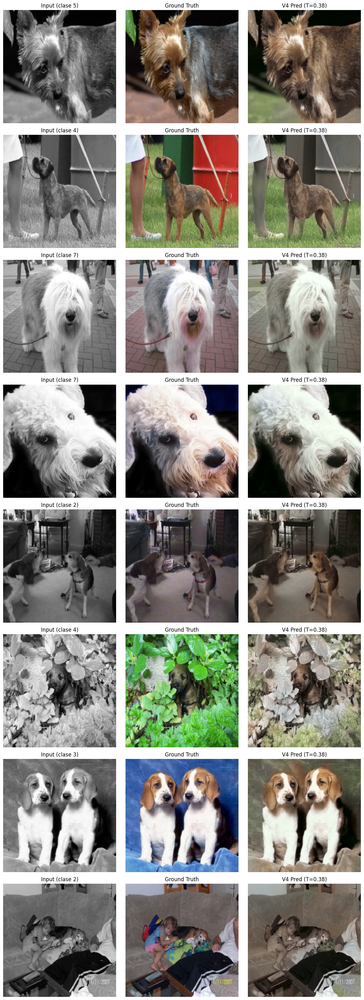

✅ Visualización guardada en 'results_v4_quantized.png'


In [29]:
# %%
# PASO 8: Visualizar resultados V4 con decodificación annealed-mean

def visualize_v4_results(model, loader, pts_ab, device, n_samples=6, T=0.38):
    """
    Visualiza colorización de V4 con annealed-mean.
    """
    model.eval()
    
    L_batch, ab_batch, labels_batch = next(iter(loader))
    L_batch = L_batch[:n_samples].to(device)
    ab_batch = ab_batch[:n_samples].to(device)
    
    with torch.no_grad():
        color_logits, scene_logits = model(L_batch)
        ab_pred = decode_ab_annealed(color_logits, pts_ab.to(device), T=T)
    
    # LAB → RGB
    from skimage import color
    def lab_to_rgb_batch(L, ab):
        imgs = []
        for i in range(L.shape[0]):
            L_np = L[i, 0].cpu().numpy() * 100.0
            ab_np = ab[i].cpu().numpy()
            
            lab = np.stack([L_np, ab_np[0], ab_np[1]], axis=-1)
            rgb = color.lab2rgb(lab)
            rgb = np.clip(rgb, 0, 1)
            imgs.append(rgb)
        return imgs
    
    rgb_true = lab_to_rgb_batch(L_batch, ab_batch)
    rgb_pred = lab_to_rgb_batch(L_batch, ab_pred)
    
    # Plot
    fig, axes = plt.subplots(n_samples, 3, figsize=(12, 4*n_samples))
    
    for i in range(n_samples):
        axes[i, 0].imshow(L_batch[i, 0].cpu(), cmap='gray')
        axes[i, 0].set_title(f'Input (clase {labels_batch[i].item()})')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(rgb_true[i])
        axes[i, 1].set_title('Ground Truth')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(rgb_pred[i])
        axes[i, 2].set_title(f'V4 Pred (T={T})')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    return fig

# Cargar mejor modelo
state_best = torch.load("best_model_v4_quantized.pth", map_location=device)
model_v4.load_state_dict(state_best)

print("Generando visualización V4...")
fig = visualize_v4_results(model_v4, val_loader_quant, pts_ab_torch, device, 
                           n_samples=8, T=0.38)
plt.savefig('results_v4_quantized.png', dpi=150, bbox_inches='tight')
plt.show()

print("✅ Visualización guardada en 'results_v4_quantized.png'")

In [ ]:
# %%
# Comparar diferentes temperaturas T

temperatures = [0.1, 0.38, 0.7, 1.0]

state_best = torch.load("best_model_v4_quantized.pth", map_location=device)
model_v4.load_state_dict(state_best)

L_batch, ab_batch, labels_batch = next(iter(val_loader_quant))
L_batch = L_batch[:4].to(device)
ab_batch = ab_batch[:4].to(device)

fig, axes = plt.subplots(4, len(temperatures)+2, figsize=(4*(len(temperatures)+2), 16))

with torch.no_grad():
    color_logits, _ = model_v4(L_batch)
    
    for i in range(4):
        # Input
        axes[i, 0].imshow(L_batch[i, 0].cpu(), cmap='gray')
        axes[i, 0].set_title('Input')
        axes[i, 0].axis('off')
        
        # GT
        from skimage import color as skcolor
        L_np = L_batch[i, 0].cpu().numpy() * 100
        ab_np = ab_batch[i].cpu().numpy()
        lab_gt = np.stack([L_np, ab_np[0], ab_np[1]], axis=-1)
        rgb_gt = skcolor.lab2rgb(lab_gt)
        axes[i, 1].imshow(np.clip(rgb_gt, 0, 1))
        axes[i, 1].set_title('Ground Truth')
        axes[i, 1].axis('off')
        
        # Diferentes temperaturas
        for j, T in enumerate(temperatures):
            ab_pred = decode_ab_annealed(color_logits[i:i+1], pts_ab_torch.to(device), T=T)
            ab_np_pred = ab_pred[0].cpu().numpy()
            lab_pred = np.stack([L_np, ab_np_pred[0], ab_np_pred[1]], axis=-1)
            rgb_pred = skcolor.lab2rgb(lab_pred)
            
            axes[i, j+2].imshow(np.clip(rgb_pred, 0, 1))
            axes[i, j+2].set_title(f'T={T}')
            axes[i, j+2].axis('off')

plt.tight_layout()
plt.savefig('temperature_comparison_v4.png', dpi=150, bbox_inches='tight')
plt.show()

print("✅ Comparación de temperaturas guardada")

In [46]:
# %%
# Fine-tuning V4 - VERSIÓN SIMPLIFICADA (sin recrear datasets)

import torch
import gc

# Limpiar memoria
torch.cuda.empty_cache()
gc.collect()

print("🔓 Descongelando encoder para fine-tuning...")

# Cargar mejor modelo
state_best = torch.load("best_model_v4_quantized.pth", map_location=device)
model_v4.load_state_dict(state_best)

# Descongelar encoder
for m in [model_v4.conv1, model_v4.bn1, model_v4.layer1, 
          model_v4.layer2, model_v4.layer3, model_v4.layer4]:
    for p in m.parameters():
        p.requires_grad = True

print("✅ Encoder descongelado")

# ==========================================
# USAR LOADERS EXISTENTES con batch size reducido
# ==========================================
BATCH_SIZE_FT = 8  
ACCUM_STEPS = 4    

# Recrear loaders con batch size reducido usando los MISMOS datasets
train_loader_ft = DataLoader(
    train_loader_quant_train.dataset,  # ← Usar dataset del loader existente
    batch_size=BATCH_SIZE_FT,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
)

val_loader_ft = DataLoader(
    val_loader_quant.dataset,  # ← Usar dataset del loader existente
    batch_size=BATCH_SIZE_FT,  
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

print(f"📦 Batch size FT: {BATCH_SIZE_FT} (accum={ACCUM_STEPS}, efectivo={BATCH_SIZE_FT*ACCUM_STEPS})")

# ==========================================
# Optimizer con LR MUY bajo
# ==========================================
optimizer_v4_ft = optim.Adam(
    filter(lambda p: p.requires_grad, model_v4.parameters()),
    lr=5e-5,  
    weight_decay=config.WEIGHT_DECAY,
)

scheduler_v4_ft = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_v4_ft, mode="min", factor=0.5, patience=2
)

# ==========================================
# Training loop CON gradient accumulation
# ==========================================
def train_epoch_v4_accum(model, loader, crit_color, crit_scene, optimizer, device, pts_ab, alpha, accum_steps):
    model.train()
    running_total = 0.0
    running_color = 0.0
    running_scene = 0.0
    
    optimizer.zero_grad()
    
    pbar = tqdm(enumerate(loader), total=len(loader), desc="Train FT")
    for i, (L, ab, labels) in pbar:
        L = L.to(device)
        ab = ab.to(device)
        labels = labels.to(device)
        
        # Quantizar ground truth
        q_target = quantize_ab_batch_chunked(ab, pts_ab.to(device), chunk_size=4096)
        
        # Forward
        color_logits, scene_logits = model(L)
        
        # Losses
        loss_color = crit_color(color_logits, q_target)
        loss_scene = crit_scene(scene_logits, labels)
        loss_total = loss_color + alpha * loss_scene
        
        # Normalizar por accumulation steps
        loss_total = loss_total / accum_steps
        
        # Backward (acumula gradientes)
        loss_total.backward()
        
        # Step solo cada accum_steps
        if (i + 1) % accum_steps == 0:
            optimizer.step()
            optimizer.zero_grad()
        
        # Stats
        running_total += loss_total.item() * accum_steps
        running_color += loss_color.item()
        running_scene += loss_scene.item()
        
        pbar.set_postfix({
            'tot': f"{loss_total.item()*accum_steps:.4f}",
            'col': f"{loss_color.item():.4f}",
            'scn': f"{loss_scene.item():.4f}"
        })
    
    # Step final si quedan gradientes acumulados
    if (i + 1) % accum_steps != 0:
        optimizer.step()
        optimizer.zero_grad()
    
    n = len(loader)
    return running_total / n, running_color / n, running_scene / n


def validate_epoch_v4_small(model, loader, crit_color, crit_scene, device, pts_ab, alpha):
    model.eval()
    running_total = 0.0
    running_color = 0.0
    running_scene = 0.0
    
    pbar = tqdm(loader, desc="Val FT")
    with torch.no_grad():
        for L, ab, labels in pbar:
            L = L.to(device)
            ab = ab.to(device)
            labels = labels.to(device)
            
            q_target = quantize_ab_batch_chunked(ab, pts_ab.to(device), chunk_size=4096)
            
            color_logits, scene_logits = model(L)
            
            loss_color = crit_color(color_logits, q_target)
            loss_scene = crit_scene(scene_logits, labels)
            loss_total = loss_color + alpha * loss_scene
            
            running_total += loss_total.item()
            running_color += loss_color.item()
            running_scene += loss_scene.item()
            
            pbar.set_postfix({
                'tot': f"{loss_total.item():.4f}",
                'col': f"{loss_color.item():.4f}"
            })
    
    n = len(loader)
    return running_total / n, running_color / n, running_scene / n


# ==========================================
# Training
# ==========================================
NUM_EPOCHS_FT = 20  
best_val_v4_ft = float("inf")

print(f"\n🚀 Fine-tuning V4 ({NUM_EPOCHS_FT} epochs, BS={BATCH_SIZE_FT}, accum={ACCUM_STEPS})\n")

for epoch in range(NUM_EPOCHS_FT):
    print(f"\n[V4-FT] Epoch {epoch+1}/{NUM_EPOCHS_FT}")
    
    train_total, train_color, train_scene = train_epoch_v4_accum(
        model_v4, train_loader_ft, criterion_color, criterion_scene,
        optimizer_v4_ft, device, pts_ab_torch, alpha=alpha_v4, accum_steps=ACCUM_STEPS
    )
    
    val_total, val_color, val_scene = validate_epoch_v4_small(
        model_v4, val_loader_ft, criterion_color, criterion_scene,
        device, pts_ab_torch, alpha=alpha_v4
    )
    
    scheduler_v4_ft.step(val_total)
    lr = optimizer_v4_ft.param_groups[0]["lr"]
    
    print(f"  Train: tot={train_total:.4f} col={train_color:.4f} scn={train_scene:.4f}")
    print(f"  Val:   tot={val_total:.4f} col={val_color:.4f} scn={val_scene:.4f}")
    print(f"  LR: {lr:.6f}")
    
    if val_total < best_val_v4_ft:
        best_val_v4_ft = val_total
        torch.save(model_v4.state_dict(), "best_model_v4_finetuned.pth")
        print("  >> 💾 Mejor modelo V4-FT guardado!")
    
    # Limpiar cache cada epoch
    torch.cuda.empty_cache()

print(f"\n✅ Fine-tuning completo. Mejor: {best_val_v4_ft:.6f}")

🔓 Descongelando encoder para fine-tuning...
✅ Encoder descongelado
📦 Batch size FT: 8 (accum=4, efectivo=32)

🚀 Fine-tuning V4 (20 epochs, BS=8, accum=4)


[V4-FT] Epoch 1/20


Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.30it/s, tot=2.5365, col=2.5294]


  Train: tot=2.6102 col=2.5967 scn=1.3566
  Val:   tot=2.5110 col=2.5026 scn=0.8393
  LR: 0.000050
  >> 💾 Mejor modelo V4-FT guardado!

[V4-FT] Epoch 2/20


Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.31it/s, tot=2.7114, col=2.7039]

  Train: tot=2.5723 col=2.5583 scn=1.3923
  Val:   tot=2.5196 col=2.5101 scn=0.9504
  LR: 0.000050

[V4-FT] Epoch 3/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.28it/s, tot=2.4980, col=2.4868]


  Train: tot=2.5431 col=2.5290 scn=1.4132
  Val:   tot=2.5096 col=2.4995 scn=1.0060
  LR: 0.000050
  >> 💾 Mejor modelo V4-FT guardado!

[V4-FT] Epoch 4/20


Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.30it/s, tot=2.6957, col=2.6873]


  Train: tot=2.5211 col=2.5068 scn=1.4350
  Val:   tot=2.5080 col=2.4976 scn=1.0454
  LR: 0.000050
  >> 💾 Mejor modelo V4-FT guardado!

[V4-FT] Epoch 5/20


Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.31it/s, tot=2.7570, col=2.7490]

  Train: tot=2.4928 col=2.4775 scn=1.5341
  Val:   tot=2.5199 col=2.5080 scn=1.1909
  LR: 0.000050

[V4-FT] Epoch 6/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.28it/s, tot=2.8953, col=2.8861]

  Train: tot=2.4556 col=2.4400 scn=1.5539
  Val:   tot=2.5521 col=2.5388 scn=1.3287
  LR: 0.000050

[V4-FT] Epoch 7/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.30it/s, tot=2.8235, col=2.8127]

  Train: tot=2.4228 col=2.4073 scn=1.5494
  Val:   tot=2.5672 col=2.5548 scn=1.2406
  LR: 0.000025

[V4-FT] Epoch 8/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.30it/s, tot=3.0975, col=3.0869]

  Train: tot=2.3744 col=2.3586 scn=1.5850
  Val:   tot=2.5678 col=2.5551 scn=1.2701
  LR: 0.000025

[V4-FT] Epoch 9/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.30it/s, tot=2.9945, col=2.9850]

  Train: tot=2.3559 col=2.3397 scn=1.6212
  Val:   tot=2.5644 col=2.5513 scn=1.3108
  LR: 0.000025

[V4-FT] Epoch 10/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.30it/s, tot=3.1476, col=3.1378]

  Train: tot=2.3284 col=2.3120 scn=1.6479
  Val:   tot=2.5767 col=2.5634 scn=1.3288
  LR: 0.000013

[V4-FT] Epoch 11/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.27it/s, tot=3.2509, col=3.2410]

  Train: tot=2.3026 col=2.2859 scn=1.6663
  Val:   tot=2.5819 col=2.5685 scn=1.3391
  LR: 0.000013

[V4-FT] Epoch 12/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.28it/s, tot=2.8551, col=2.8460]

  Train: tot=2.2858 col=2.2693 scn=1.6445
  Val:   tot=2.6001 col=2.5866 scn=1.3459
  LR: 0.000013

[V4-FT] Epoch 13/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.29it/s, tot=2.9783, col=2.9689]

  Train: tot=2.2746 col=2.2580 scn=1.6574
  Val:   tot=2.5884 col=2.5746 scn=1.3777
  LR: 0.000006

[V4-FT] Epoch 14/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.28it/s, tot=3.0491, col=3.0404]

  Train: tot=2.2586 col=2.2419 scn=1.6652
  Val:   tot=2.6013 col=2.5878 scn=1.3508
  LR: 0.000006

[V4-FT] Epoch 15/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.27it/s, tot=3.0827, col=3.0735]

  Train: tot=2.2501 col=2.2333 scn=1.6752
  Val:   tot=2.6125 col=2.5987 scn=1.3824
  LR: 0.000006

[V4-FT] Epoch 16/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.26it/s, tot=3.0062, col=2.9969]

  Train: tot=2.2428 col=2.2261 scn=1.6645
  Val:   tot=2.6028 col=2.5896 scn=1.3194
  LR: 0.000003

[V4-FT] Epoch 17/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.25it/s, tot=3.3820, col=3.3720]

  Train: tot=2.2386 col=2.2218 scn=1.6825
  Val:   tot=2.6227 col=2.6088 scn=1.3877
  LR: 0.000003

[V4-FT] Epoch 18/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.27it/s, tot=3.3087, col=3.2980]

  Train: tot=2.2314 col=2.2146 scn=1.6826
  Val:   tot=2.6274 col=2.6133 scn=1.4104
  LR: 0.000003

[V4-FT] Epoch 19/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.27it/s, tot=2.9906, col=2.9814]

  Train: tot=2.2283 col=2.2115 scn=1.6793
  Val:   tot=2.6032 col=2.5896 scn=1.3578
  LR: 0.000002

[V4-FT] Epoch 20/20



Val FT: 100%|██████████| 246/246 [00:29<00:00,  8.26it/s, tot=3.1305, col=3.1207]

  Train: tot=2.2205 col=2.2036 scn=1.6885
  Val:   tot=2.6215 col=2.6075 scn=1.3932
  LR: 0.000002

✅ Fine-tuning completo. Mejor: 2.508047
